In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [ ]:
import torchvision 
import torchvision.transforms as transforms
import torch.optim as optim
from torch.optim.lr_scheduler import LambdaLR, StepLR, MultiStepLR, ExponentialLR, ReduceLROnPlateau
import torch.nn.functional as F
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import models
import numpy as np
import torch
from torch.utils.data import Dataset
from PIL import Image

In [ ]:
# clearing cache files
torch.cuda.empty_cache()

**Downloading Cifar 10**

In [ ]:
batch_size = 32
# batch_size = 64

transform = transforms.Compose([transforms.Resize(size=(224, 224)), 
                                transforms.ToTensor(),
                                transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
    ])

trainset = torchvision.datasets.CIFAR10(root= './data', train=True, transform=transform, download=True)
testset = torchvision.datasets.CIFAR10(root= './data', train=False, transform= transform, download=True)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [ ]:
# checking the shape of a single image 
print("Shape of a single iamge: ", trainset[0][0].shape)

Shape of a single iamge:  torch.Size([3, 224, 224])


In [ ]:
len(trainset)

50000

**Model Path**

In [ ]:
# Getting Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/"
cam_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/"

In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler

# taking 20 percent (10,000) data as validation set 
valid_size = 0.2


# obtain training indices that will be used for validation
num_train = len(trainset)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# prepare data loaders (combine dataset and sampler)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
    sampler=train_sampler)
valid_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, 
    sampler=valid_sampler)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size)

# image classes
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck']

In [ ]:
print(len(train_loader))
print(len(test_loader))

1250
313


In [ ]:
%matplotlib inline

# helper function to display an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    img = np.clip(img, 0, 1)
    plt.imshow(np.transpose(img, (1, 2, 0))) 

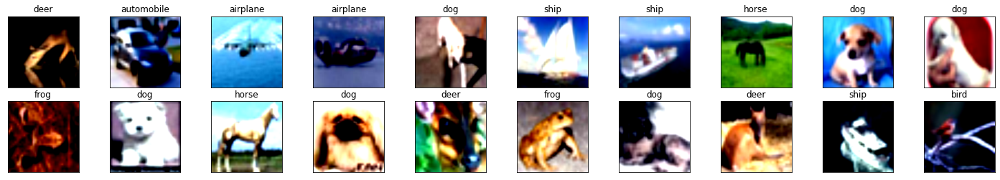

In [ ]:
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # Converted Image to numpy

# plot the images in the batch, along with the corresponding labels

fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

**Downloading Pre-trained VGG 16 Model**

In [ ]:
vgg_16 = models.vgg16(pretrained= True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [ ]:
print(vgg_16)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

**Freeze Model weights**

In [ ]:
# freeze models parameters to use pre-traine dmodel weights 
for params in vgg_16.parameters():
  params.requires_grad = False

**Discarding FC Layer, Adding GAP Layer, Adding FC Layer with 10 outputs**

In [ ]:
# This class allow to discard a layer from vgg 16 
class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()
        
    def forward(self, x):
        return x

In [ ]:
# Printing classifier 
print(vgg_16.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


In [ ]:
# Discarding that classifier 
vgg_16.classifier = Identity()
# Now printing the classifier 
print(vgg_16.classifier)

Identity()


In [ ]:
# Checking avg pool
vgg_16.avgpool

AdaptiveAvgPool2d(output_size=(7, 7))

In [ ]:
# Now defining GAP Layer 
vgg_16.avgpool = nn.AdaptiveAvgPool2d((1,1))

# checking new avgpool layer 
print(vgg_16.avgpool)

AdaptiveAvgPool2d(output_size=(1, 1))


In [ ]:
# Now taking a FC layer with 109 outputs in our classsifier
vgg_16.classifier = nn.Linear(512, 10)
print(vgg_16.classifier)

Linear(in_features=512, out_features=10, bias=True)


In [ ]:
 # Now priniting our customized VGG 16 -GAP Model
print(vgg_16)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
model = vgg_16
if torch.cuda.is_available():
  model.cuda()

In [ ]:
from torchsummary import summary
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

**Loss function, Optimizer, Learning Rate Scheduler**

In [ ]:
from torch.optim import lr_scheduler
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum= 0.9, weight_decay= 5e-4)

# defining learning rate scheduler 
# scheduler = lr_scheduler.StepLR(optimizer, step_size= 5, gamma=0.1)

## Training  

In [ ]:
# number of epochs to train the model
n_epochs = 20

valid_loss_min = np.Inf # track change in validation loss

valid_list= []  # stores validation losses
train_list= []  # stores train losses

valid_acc = [] # store validation accuracy
train_acc = [] # store train accuracy

for epoch in range(1, n_epochs+1):

    # keep track of training, validation loss and accuracy
    train_loss = 0.0
    valid_loss = 0.0
    train_corrects = 0
    val_corrects = 0

    # trianing the model
    model.train()
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()

        optimizer.zero_grad()
        output = model(data)
        _,preds = torch.max(output, 1)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()*data.size(0)
        train_corrects += torch.sum(preds == target.data)
        
          
    # validate the model 
    model.eval()
    for data, target in valid_loader:
        # move tensors to GPU if CUDA is available
        if torch.cuda.is_available():
            data, target = data.cuda(), target.cuda()
        
        output = model(data)
        _,preds = torch.max(output, 1)
        loss = criterion(output, target)
        valid_loss += loss.item()*data.size(0)
        val_corrects += torch.sum(preds == target.data) 
    
    # calculate average losses
    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(valid_loader.sampler)
    # calculate accuracy
    t_acc = train_corrects/len(train_loader.sampler)
    v_acc = val_corrects/len(valid_loader.sampler)
        
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f} \tTrain Acc: {:4f} \tValidation Acc: {:4f}'.format(
        epoch, train_loss, valid_loss, t_acc, v_acc))
    
    # Using Schedular step
    # scheduler.step()
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        valid_loss))
        torch.save(model.state_dict(), model_path+'vgg16_GAP_cifar.pt')
        valid_loss_min = valid_loss
    
    #storing train and validation looses
    train_list.append(train_loss)
    valid_list.append(valid_loss)
    # storing train and validartion accuracy
    train_acc.append(t_acc)
    valid_acc.append(v_acc)

Epoch: 1 	Training Loss: 1.446057 	Validation Loss: 1.072000 	Train Acc: 0.639950 	Validation Acc: 0.729400
Validation loss decreased (inf --> 1.072000).  Saving model ...
Epoch: 2 	Training Loss: 0.960973 	Validation Loss: 0.876526 	Train Acc: 0.740025 	Validation Acc: 0.753800
Validation loss decreased (1.072000 --> 0.876526).  Saving model ...
Epoch: 3 	Training Loss: 0.830484 	Validation Loss: 0.791378 	Train Acc: 0.760350 	Validation Acc: 0.765900
Validation loss decreased (0.876526 --> 0.791378).  Saving model ...
Epoch: 4 	Training Loss: 0.761862 	Validation Loss: 0.737832 	Train Acc: 0.774000 	Validation Acc: 0.776100
Validation loss decreased (0.791378 --> 0.737832).  Saving model ...
Epoch: 5 	Training Loss: 0.717370 	Validation Loss: 0.701840 	Train Acc: 0.783900 	Validation Acc: 0.783300
Validation loss decreased (0.737832 --> 0.701840).  Saving model ...
Epoch: 6 	Training Loss: 0.686046 	Validation Loss: 0.675785 	Train Acc: 0.790150 	Validation Acc: 0.790500
Validation l

**Plotting Training Loss VS Validation Loss**

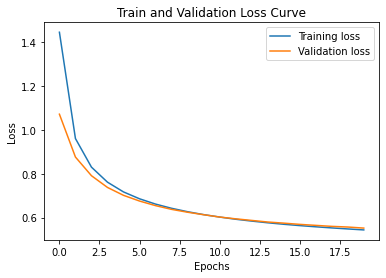

In [ ]:
 # plotting the training and validation loss
plt.plot(train_list, label='Training loss')
plt.plot(valid_list, label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Train and Validation Loss Curve")
plt.legend()
plt.show()

**Plotting Training Accuracy VS Validation Accuracy**

In [ ]:
# moving train_acc and valid_acc to CPU
new_train_acc = torch.tensor(train_acc, device = 'cpu')
new_valid_acc = torch.tensor(valid_acc, device= 'cpu')

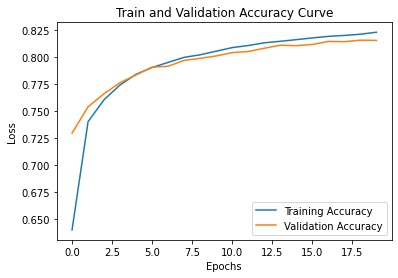

In [ ]:
 # plotting the training and validation loss
plt.plot(new_train_acc, label='Training Accuracy')
plt.plot(new_valid_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Train and Validation Accuracy Curve")
plt.legend()
plt.show()

In [ ]:
# Loading Model with minimum loss
model.load_state_dict(torch.load(model_path+'vgg16_GAP_cifar.pt'))

<All keys matched successfully>

**Accuracy on Test data**

In [ ]:
test_loss = 0.0

running_corrects= 0 

model.eval()
# iterate over test data
for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if  torch.cuda.is_available():
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)    
    # compare predictions to true label
    running_corrects += torch.sum(pred == target.data)
    

# average test loss
test_loss = test_loss/len(test_loader.dataset)
acc = running_corrects.double() / (len(test_loader) * batch_size)
acc = acc * 100
print('Test Loss: {:.6f}\n'.format(test_loss))
print(f'Overall Accuracy: {acc:.2f} %')

Test Loss: 0.564067

Overall Accuracy: 81.28 %


**Plotting Confusion Matrix**

In [ ]:
# Function to plot confusion matrix

from sklearn.metrics import confusion_matrix
import itertools
import numpy as np
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
@torch.no_grad()
def prediction(model, batch_loader):
  if torch.cuda.is_available():
    total_preds = torch.tensor([]).cuda()
  else:
    total_preds = torch.tensor([])
  
  #set model to evaluation mode
  model.eval()

  for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if torch.cuda.is_available():
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # convert output probabilities to predicted class
    _,pred = torch.max(output, 1) 
    
    total_preds = torch.cat(
            (total_preds, output)
            ,dim=0
        )
  return total_preds

In [ ]:
# Loading saved model
loaded_model = model
loaded_model.load_state_dict(torch.load(model_path+'vgg16_GAP_cifar.pt', map_location=torch.device('cpu')))

<All keys matched successfully>

In [ ]:
# i = 0
# for param in loaded_model.parameters():
#   print(param)
#   i += 1
#   if i > 2:
#     break

In [ ]:
#test_prediction_loader = torch.utils.data.DataLoader(test_data, batch_size=32)
with torch.no_grad():
    test_prediction_loader = torch.utils.data.DataLoader(testset, batch_size= 32)
    test_labels = []
    for images, targets in test_loader:
      test_labels.append(targets.data)
      
    test_preds = prediction(loaded_model, test_prediction_loader)

In [ ]:
test_labels = torch.cat(test_labels)
print(len(test_labels))

10000


Confusion matrix, without normalization


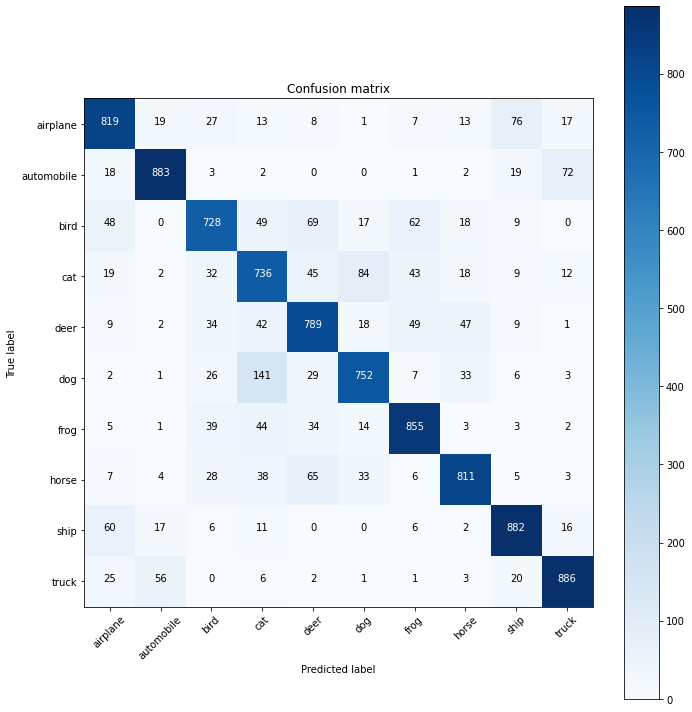

In [ ]:
test_preds = test_preds.cpu()
conf_matrix = confusion_matrix(test_labels, test_preds.argmax(dim= 1))
#print(conf_matrix)
plt.figure(figsize=(10,10))
plot_confusion_matrix(conf_matrix, classes)

**F-1 Score**

In [ ]:
from sklearn.metrics import f1_score
pred_test = test_preds.argmax(dim= 1)
f1_score(test_labels, pred_test, average='weighted')

0.814196922729548

# Class Activation Mapping (CAM)

In [ ]:
# Loading Model
# We have trained our model in GPU
loaded_model = model
if torch.cuda.is_available():
  loaded_model.load_state_dict(torch.load(model_path+'vgg16_GAP_cifar.pt'))
else:
  loaded_model.load_state_dict(torch.load(model_path+'vgg16_GAP_cifar.pt', map_location=torch.device('cpu')))

In [ ]:
# Getting our classifiers/fc layer weights
params = list(loaded_model.classifier.parameters())

In [ ]:
print(len(params))

2


In [ ]:
print("Shape of our weights: ", params[0].shape)
print("Shape of Bias: ", params[1].shape)

Shape of our weights:  torch.Size([10, 512])
Shape of Bias:  torch.Size([10])


In [ ]:
#extracting weights from params
weight = np.squeeze(params[0].data.cpu().numpy())
print('Shape of weight as numpy: ', weight.shape)

Shape of weight as numpy:  (10, 512)


# Test

In [ ]:
# getting softmax scores for 1 batch images

images, labels = next(iter(test_loader))
#print(labels)
loaded_model.eval()
if torch.cuda.is_available():
  images, labels = images.cuda(), labels.cuda()
scores = loaded_model(images)
#print(scores)
# getting probability distribution by using softmax
probs = F.softmax(scores, dim=1)
w_prob = torch.max(probs, dim=1)  # it returns maximum value along with it's index
w_class = torch.argmax(probs, dim= 1)

In [ ]:
print(labels)
print(w_prob)
print(w_class)

tensor([3, 8, 8, 0, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 8, 5, 7, 8, 6, 7, 0, 4, 9,
        5, 2, 4, 0, 9, 6, 6, 5])
torch.return_types.max(
values=tensor([0.5943, 0.7803, 0.8274, 0.3612, 0.9940, 0.8208, 0.9219, 0.6207, 0.9731,
        0.7323, 0.8226, 0.9978, 0.7948, 0.6901, 0.9981, 0.4472, 0.9824, 0.8069,
        0.9648, 0.9906, 0.5774, 0.9385, 0.7510, 0.5212, 0.5187, 0.5087, 0.4337,
        0.4083, 0.9813, 0.9892, 0.8585, 0.8290], grad_fn=<MaxBackward0>),
indices=tensor([3, 8, 8, 8, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 6, 5, 7, 8, 6, 7, 0, 4, 1,
        5, 2, 4, 0, 9, 6, 6, 5]))
tensor([3, 8, 8, 8, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 6, 5, 7, 8, 6, 7, 0, 4, 1,
        5, 2, 4, 0, 9, 6, 6, 5])


In [ ]:
w_prob[1]

tensor([3, 8, 8, 8, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 6, 5, 7, 8, 6, 7, 0, 4, 1,
        5, 2, 4, 0, 9, 6, 6, 5])

In [ ]:
v = w_prob[1][1]
print(v)
b = v.cpu().detach().numpy()
print(b)

tensor(8, device='cuda:0')
8


In [ ]:
classes[b]

'ship'

In [ ]:
c = w_prob[0][1].cpu().detach().numpy()
print(c)

0.78031886


In [ ]:
for i in range(len(labels)):
  true_label = labels[i].cpu().detach().numpy()
  pred_label = w_prob[1][i].cpu().detach().numpy()
  pred_score = w_prob[0][i].cpu().detach().numpy()
  print('Probability: ',pred_score, '\tTrue class:', classes[true_label], '\tPredicted class:', classes[pred_label])

Probability:  0.59426475 	True class: cat 	Predicted class: cat
Probability:  0.7803192 	True class: ship 	Predicted class: ship
Probability:  0.8273656 	True class: ship 	Predicted class: ship
Probability:  0.36119223 	True class: airplane 	Predicted class: ship
Probability:  0.9939579 	True class: frog 	Predicted class: frog
Probability:  0.82079935 	True class: frog 	Predicted class: frog
Probability:  0.9218656 	True class: automobile 	Predicted class: automobile
Probability:  0.6206674 	True class: frog 	Predicted class: frog
Probability:  0.97311777 	True class: cat 	Predicted class: cat
Probability:  0.73228294 	True class: automobile 	Predicted class: automobile
Probability:  0.82260853 	True class: airplane 	Predicted class: airplane
Probability:  0.99782085 	True class: truck 	Predicted class: truck
Probability:  0.7948392 	True class: dog 	Predicted class: dog
Probability:  0.6900624 	True class: horse 	Predicted class: horse
Probability:  0.99812704 	True class: truck 	Pred

In [ ]:
# identify correctness
k = 0
for i in range(len(labels)):
  true_label = labels[i].cpu().detach().numpy()
  pred_label = w_prob[1][i].cpu().detach().numpy()
  if true_label == pred_label:
    k += 1
print(k)

29


In [ ]:
# getting feature maps
features_demo = loaded_model.features(images)

In [ ]:
features_demo.shape

torch.Size([32, 512, 7, 7])

In [ ]:
dummy = features_demo[0]
print(dummy.shape)

torch.Size([512, 7, 7])


In [ ]:
size_upsample = (224, 224)

In [ ]:
bz, nc, h, w = features_demo.shape

In [ ]:
print(bz, nc, h, w)

32 512 7 7


In [ ]:
import cv2
import copy

In [ ]:
weight[2].shape

(512,)

In [ ]:
# if gpu enable 
if torch.cuda.is_available():
  w_class = w_class.cpu()
  # weight = weight.cpu()

In [ ]:
output_cam = []
for idx in w_class.detach().numpy():
  cam = weight[idx].dot(features_demo[0].cpu().detach().numpy().reshape((nc, h*w)))
  cam = cam.reshape(h, w)
  cam = cam - np.min(cam)
  cam_img = cam / np.max(cam)
  #cam_img = np.uint8(255 * cam_img)
  output_cam.append(cv2.resize(cam_img, size_upsample))

In [ ]:
len(output_cam)

32

In [ ]:
output_cam[1].shape

(224, 224)

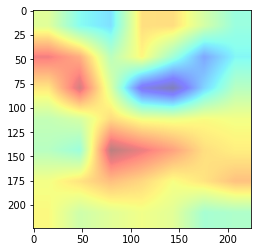

In [ ]:
plt.imshow(output_cam[11], alpha=0.5, cmap='jet')
plt.savefig(model_path+ 'hehe.png')

In [ ]:
t_img = images[11].cpu()
t_img = t_img.reshape((3, 224, 224)).numpy().transpose((1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


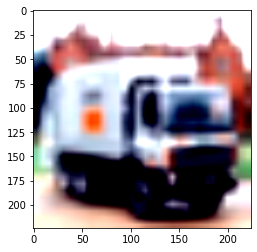

In [ ]:
t_img.shape
imshow(images[11].cpu())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


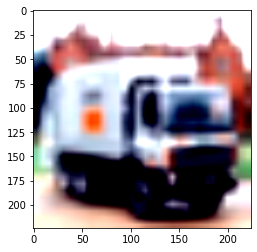

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


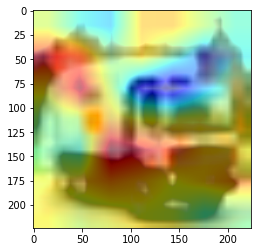

In [ ]:
import skimage.transform
t_img = t_img / 2 + 0.5
plt.imshow(t_img)
plt.show()
plt.imshow(t_img)
plt.imshow(skimage.transform.resize(output_cam[11]*255, (224,224)) *255.0,  alpha=0.5, cmap='jet')
plt.show()

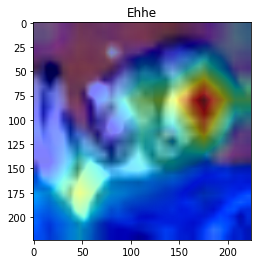

In [ ]:
h_img = skimage.transform.resize(output_cam[], (224,224))
h_img = np.clip(h_img, 0,1)
t_img = np.clip(t_img, 0, 1)
plt.imshow(t_img)
plt.imshow(h_img, alpha= 0.5, cmap='jet')
plt.title('Ehhe')
plt.savefig(model_path+'try.png')

In [ ]:
h_img.shape

(224, 224, 3)

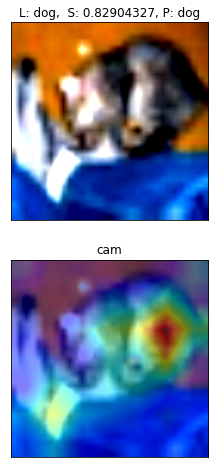

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])
plt.imshow(t_img)
ax.set_title('L: '+ classes[labels[i].detach().numpy()] + ',  S: '+ str(w_prob[0][i].detach().numpy()) +', P: '+ classes[w_class[i]])
ax = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
plt.imshow(t_img)
plt.imshow(h_img, alpha=0.5, cmap='jet')
ax.set_title('cam')
plt.savefig(model_path+ 'dummy.png')

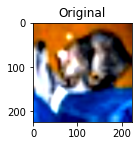

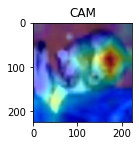

In [ ]:
plt.figure()
plt.subplot(2,2,1)
plt.imshow(t_img)
plt.title('Original')

plt.figure()
plt.subplot(2,2,1)
plt.imshow(t_img)
plt.imshow(h_img, alpha= 0.5, cmap='jet')
plt.title('CAM')
plt.savefig(model_path+'try_sub.png')

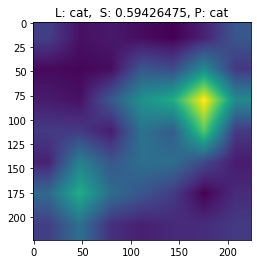

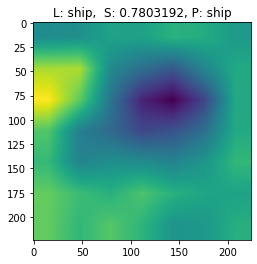

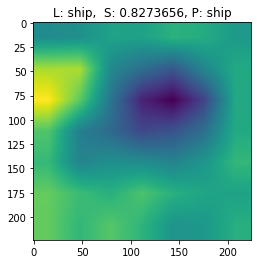

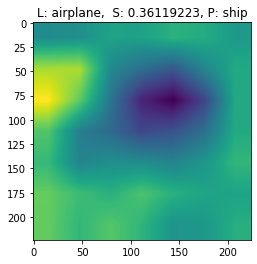

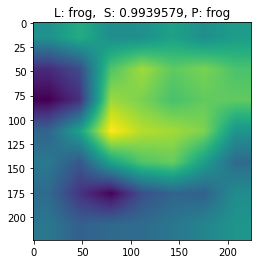

...

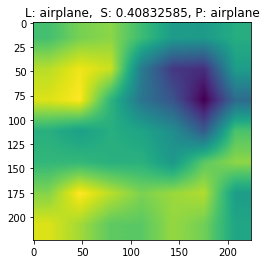

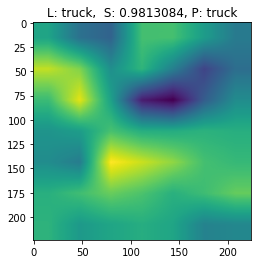

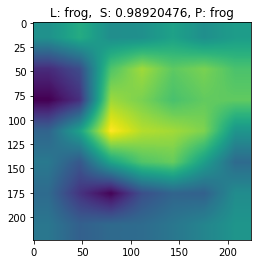

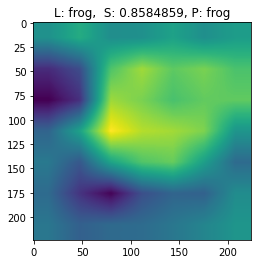

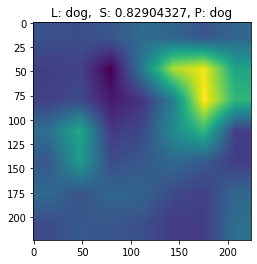

In [ ]:
for i in range(len(images)):
  plt.imshow(output_cam[i])
  plt.title('L: '+ classes[labels[i].detach().numpy()] + ',  S: '+ str(w_prob[0][i].detach().numpy()) +', P: '+ classes[w_class[i]])
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


frog


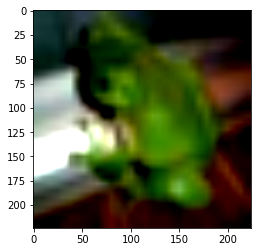

In [ ]:
p_img = images[7]
imshow(p_img)
print(classes[labels[7]])


In [ ]:
c, height, width = p_img.shape
print(c, height, width)

3 224 224


In [ ]:
p_img = p_img.reshape((3, 224, 224)).numpy().transpose((1, 2, 0))

In [ ]:
p_img.shape

(224, 224, 3)

In [ ]:
heatmap = cv2.applyColorMap(cv2.resize(output_cam[7],(224, 224)), cv2.COLORMAP_JET)
#result = heatmap * 0.3 + d_img * 0.5

In [ ]:
heatmap.shape

(224, 224, 3)

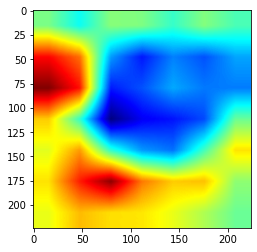

In [ ]:
plt.imshow(heatmap)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


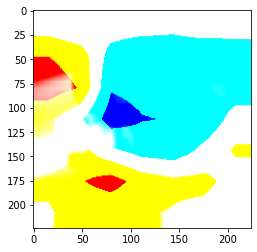

In [ ]:
result = heatmap * 0.4  + p_img 
plt.imshow(result)

In [ ]:
import scipy as sp
s_img = sp.ndimage.zoom(output_cam[7], (32,32), order=1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


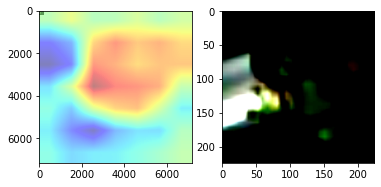

In [ ]:
plt.subplot(1,2,1)
plt.imshow(p_img, alpha=0.8)
plt.imshow(s_img, cmap= 'jet', alpha= 0.5)
plt.subplot(1,2,2)
plt.imshow(p_img)
plt.show()

In [ ]:
def overlay_heatmap(heatmap, image, alpha=0.5, colormap=cv2.COLORMAP_VIRIDIS):
  # apply the supplied color map to the heatmap and then
	# overlay the heatmap on the input image
	heatmap = cv2.applyColorMap(heatmap, colormap)
	output = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
	# return a 2-tuple of the color mapped heatmap and the output,
	# overlaid image
	return (heatmap, output)

# Generating CAM and Store in Folder

In [ ]:
def get_cam(feature_conv, weight, p_class):
  size_upsample = (224,224)
  bz, nc, h, w = feature_conv.shape
  output_cam = []
  for idx in p_class.cpu().detach().numpy():
    cam = weight[idx].dot(feature_conv[0].cpu().detach().numpy().reshape((nc, h*w)))
    cam = cam.reshape(h, w)
    cam = cam - np.min(cam)
    cam_img = cam / np.max(cam)
    #cam_img = np.uint8(255 * cam_img)
    output_cam.append(cv2.resize(cam_img, size_upsample))
  output = torch.as_tensor(output_cam)
  # return output.cuda()
  return output

In [ ]:
import cv2
import copy

if torch.cuda.is_available():
  test_images = torch.tensor([]).cuda()
  test_labels = torch.tensor([]).cuda()
  # total_feature_maps = torch.tensor([]).cuda()
  total_class_probs = torch.tensor([]).cuda()
  total_cam_images = torch.tensor([]).cuda()
  total_pred_class = torch.tensor([]).cuda()
else:
  test_images = torch.tensor([])
  test_labels = torch.tensor([])
  # total_feature_maps = torch.tensor([])
  total_class_probs = torch.tensor([])
  total_cam_images = torch.tensor([])
  total_pred_class = torch.tensor([])

loaded_model.eval()

k = 0

for images, labels in test_loader:
  # move tensors to GPU if CUDA is available
  if torch.cuda.is_available():
    images, labels = images.cuda(), labels.cuda()
  
  # storing images
  test_images = torch.cat(
            (test_images, images)
            ,dim=0
        )
  #storing labels
  test_labels = torch.cat(
            (test_labels, labels)
            ,dim=0
        )

  #getting feature maps
  feature_maps = loaded_model.features(images)

  # storing feature maps
  # total_feature_maps = torch.cat(
  #           (total_feature_maps, feature_maps)
  #           ,dim=0
  #       )

  # getting prediction scores
  scores = loaded_model(images)

  #converting scores to probability distribution
  probs = F.softmax(scores, dim=1)
  class_prob = torch.max(probs, dim=1)  # it returns maximum value along with it's index

  # storing total probabilities
  total_class_probs = torch.cat(
      (total_class_probs, class_prob[0])
      ,dim=0
  )

  pred_class = class_prob[1]

  total_pred_class = torch.cat(
      (total_pred_class, pred_class)
      ,dim=0
  )

  #getting cam images 
  cam_images = get_cam(feature_maps, weight, pred_class)

  # storing cam images
  total_cam_images = torch.cat(
            (total_cam_images, cam_images)
            ,dim=0
        )
  k += 1
 # print(str(k+1)+" no  batch iteration completed. ")
  if k> 156:
    break

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  if sys.path[0] == '':


In [ ]:
print("Number of test images: ",len(test_images))
print("Number of test labels: ",len(test_labels))
print("Number of CAM images: ",len(total_cam_images))
print("Number of class probabilities: ",len(total_class_probs))
print("Number of predicted labels: ",len(total_pred_class))

Number of test images:  5024
Number of test labels:  5024
Number of CAM images:  5024
Number of class probabilities:  5024
Number of predicted labels:  5024


In [ ]:
for i in range(50):
  true_label = int(test_labels[i].cpu().detach().numpy())
  pred_label = int(total_pred_class[i].cpu().detach().numpy())
  pred_score = total_class_probs[i].cpu().detach().numpy()
  print('Probability: ',pred_score, '\tTrue class:', classes[true_label], '\tPredicted class:', classes[pred_label])

Probability:  0.59426475 	True class: cat 	Predicted class: cat
Probability:  0.7803192 	True class: ship 	Predicted class: ship
Probability:  0.8273656 	True class: ship 	Predicted class: ship
Probability:  0.36119223 	True class: airplane 	Predicted class: ship
Probability:  0.9939579 	True class: frog 	Predicted class: frog
Probability:  0.82079935 	True class: frog 	Predicted class: frog
Probability:  0.9218656 	True class: automobile 	Predicted class: automobile
Probability:  0.6206674 	True class: frog 	Predicted class: frog
Probability:  0.97311777 	True class: cat 	Predicted class: cat
Probability:  0.73228294 	True class: automobile 	Predicted class: automobile
Probability:  0.82260853 	True class: airplane 	Predicted class: airplane
Probability:  0.99782085 	True class: truck 	Predicted class: truck
Probability:  0.7948392 	True class: dog 	Predicted class: dog
Probability:  0.6900624 	True class: horse 	Predicted class: horse
Probability:  0.99812704 	True class: truck 	Pred

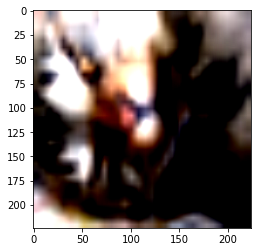

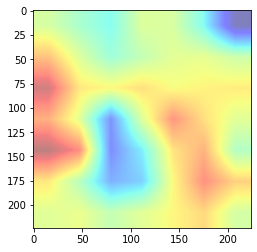

In [ ]:
# plotting a sample cam image 
imshow(test_images[224])
plt.show()

plt.imshow(total_cam_images[124], alpha=0.5, cmap="jet")

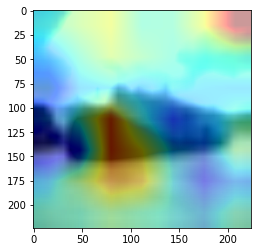

In [ ]:
# plotting image with cam
import skimage.transform
t_img = test_images[124]
imshow(t_img)
plt.imshow(skimage.transform.resize(total_cam_images[124], (224,224)) *255.0,  alpha=0.4, cmap='jet_r')
plt.show()

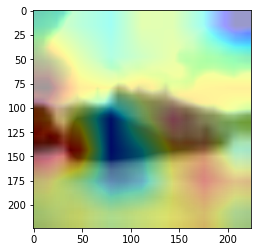

In [ ]:
import skimage.transform
t_img = test_images[124]
imshow(t_img)
plt.imshow(skimage.transform.resize(total_cam_images[124], (224,224)) *255.0,  alpha=0.4, cmap='jet')
plt.show()

Plot a single CAM image with original one, and also it's ground truth, score, predicted class

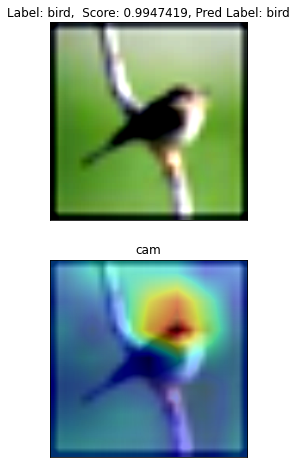

In [ ]:
d_img = test_images[3333]
d_img_t_l = int(test_labels[3333].detach().numpy())
d_img_l = int(total_pred_class[3333].cpu().detach().numpy()) 
d_img_p = total_class_probs[3333].cpu().detach().numpy()
d_cam = total_cam_images[3333]

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])
imshow(d_img)
ax.set_title('Label: '+ classes[d_img_t_l] + ',  Score: '+ str(d_img_p) +', Pred Label: '+ classes[d_img_l])
ax = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
imshow(d_img)
plt.imshow(d_cam, alpha=0.45, cmap='jet')
ax.set_title('cam')
plt.savefig(model_path+ 'dummy.png')

In [ ]:
w = test_labels.detach().numpy()
print(len(w))
print(type(w))
print(w[1])

5024
<class 'numpy.ndarray'>
8.0


In [ ]:
test_true_labels = test_labels.detach().numpy()
test_pred_labels = total_pred_class.detach().numpy()
test_pred_scores = total_class_probs.detach().numpy() 
print(len(test_true_labels),"A demo: ", test_true_labels[0])
print(len(test_pred_labels),"A demo: ", test_pred_labels[0])
print(len(test_pred_scores),"A demo: ", test_pred_scores[0])

5024 A demo:  3.0
5024 A demo:  3.0
5024 A demo:  0.59426475


In [ ]:
from torchvision.utils import save_image

In [ ]:
save_image(d_cam, model_path+'g.png')

In [ ]:
plt.imsave(model_path+'t.png', d_cam,  cmap='jet' )

In [ ]:
plt.imsave(model_path+'t2.png', total_cam_images[976], cmap='jet' )

In [ ]:
a = [1, 9, 3]
b = [1, 2, 3]

for i in range(len(a)):
  if (a[i]==1) and (a[i]==b[i]):
    print('Tarek')

  if (a[i]==2) and (a[i]==b[i]):
    print('Taaareek')

  if (a[i]==3) and (a[i]==b[i]):
    print('Taaaaaaareeeeeeeeeek')

Tarek
Taaaaaaareeeeeeeeeek


**Saving 1000 images**

In [ ]:
correct_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/"
wrong_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Wrong/"

class_0_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_0/"
class_1_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_1/"
class_2_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_2/"
class_3_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_3/"
class_4_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_4/"
class_5_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_5/"
class_6_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_6/"
class_7_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_7/"
class_8_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_8/"
class_9_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Correct/class_9/"


cls_0 = 1
cls_1 = 1
cls_2 = 1
cls_3 = 1
cls_4 = 1
cls_5 = 1
cls_6 = 1
cls_7 = 1
cls_8 = 1
cls_9 = 1

k = 1

for i in range(len(total_cam_images)):
  if (test_true_labels[i] == 0) and (test_true_labels[i] == test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[0] +'-' +str(cls_0) +'_CAM.png'
    # getting image
    img_0 = total_cam_images[i]
    #saving images 
    plt.imsave(class_0_path+img_name, img_0, cmap= 'jet')
    
    cls_0 += 1

    if cls_0 > 100:
      break

  if (test_true_labels[i] == 1) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[1] +'-' +str(cls_1) +'_CAM.png'
      # getting image
      img_1 = total_cam_images[i]
      #saving images 
      plt.imsave(class_1_path+img_name, img_1, cmap= 'jet')
      
      cls_1 += 1

      if cls_1 > 100:
        break

  if (test_true_labels[i] == 2) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[2] +'-' +str(cls_2) +'_CAM.png'
      # getting image
      img_2 = total_cam_images[i]
      #saving images 
      plt.imsave(class_2_path+img_name, img_2, cmap= 'jet')
      
      cls_2 += 1

      if cls_2 > 100:
        break

  if (test_true_labels[i] == 3) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[3] +'-' +str(cls_3) +'_CAM.png'
      # getting image
      img_3 = total_cam_images[i]
      #saving images 
      plt.imsave(class_3_path+img_name, img_3, cmap= 'jet')
      
      cls_3 += 1

      if cls_3 > 100:
        break

  if (test_true_labels[i] == 4) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[4] +'-' +str(cls_4) +'_CAM.png'
      # getting image
      img_4 = total_cam_images[i]
      #saving images 
      plt.imsave(class_4_path+img_name, img_4, cmap= 'jet')
      
      cls_4 += 1

      if cls_4 > 100:
        break

  if (test_true_labels[i] == 5) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[5] +'-' +str(cls_5) +'_CAM.png'
      # getting image
      img_5 = total_cam_images[i]
      #saving images 
      plt.imsave(class_5_path+img_name, img_5, cmap= 'jet')
      
      cls_5 += 1

      if cls_5 > 100:
        break 

  if (test_true_labels[i] == 6) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[6] +'-' +str(cls_6) +'_CAM.png'
      # getting image
      img_6 = total_cam_images[i]
      #saving images 
      plt.imsave(class_6_path+img_name, img_6, cmap= 'jet')
      
      cls_6 += 1

      if cls_6 > 100:
        break 

  if (test_true_labels[i] == 7) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[7] +'-' +str(cls_7) +'_CAM.png'
      # getting image
      img_7 = total_cam_images[i]
      #saving images 
      plt.imsave(class_7_path+img_name, img_7, cmap= 'jet')
      
      cls_7 += 1

      if cls_7 > 100:
        break 

  if (test_true_labels[i] == 8) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[8] +'-' +str(cls_8) +'_CAM.png'
      # getting image
      img_8 = total_cam_images[i]
      #saving images 
      plt.imsave(class_8_path+img_name, img_8, cmap= 'jet')
      
      cls_8 += 1

      if cls_8 > 100:
        break 

  if (test_true_labels[i] == 9) and (test_true_labels[i] == test_pred_labels[i]):
      # defining image name for each class 
      img_name = classes[9] +'-' +str(cls_9) +'_CAM.png'
      # getting image
      img_9 = total_cam_images[i]
      #saving images 
      plt.imsave(class_9_path+img_name, img_9, cmap= 'jet')
      
      cls_9 += 1

      if cls_9 > 100:
        break
print("Completed...!")

Completed...!


**Plotting Images with CAM Images**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


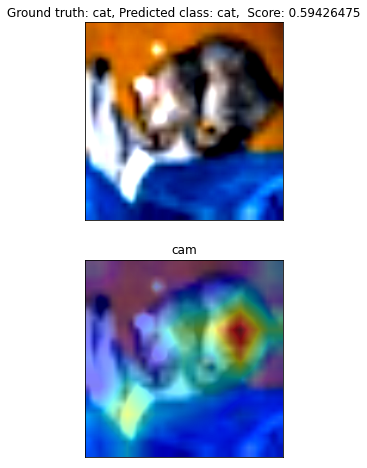

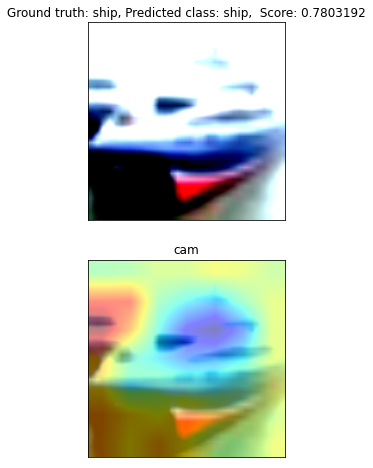

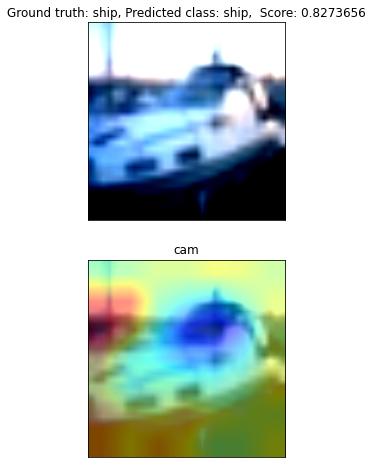

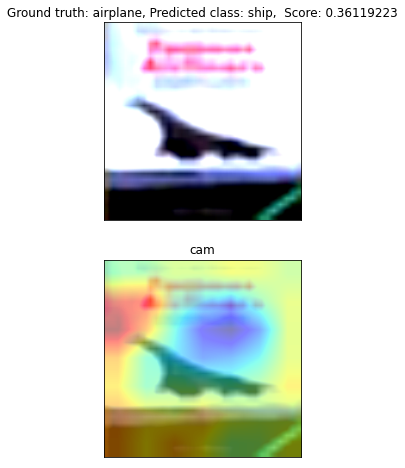

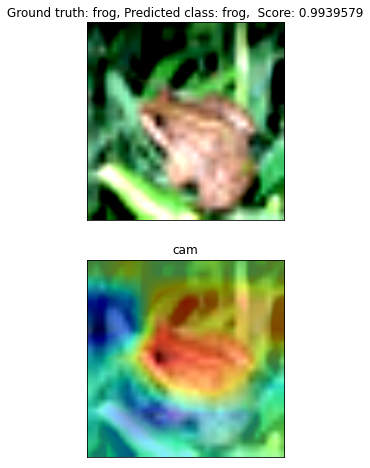

...

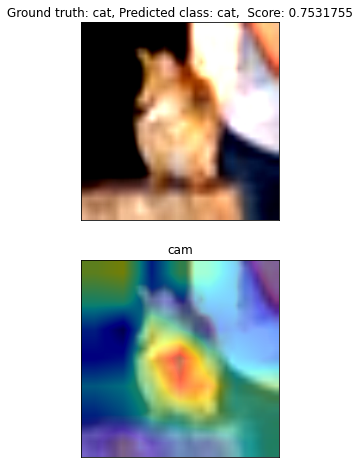

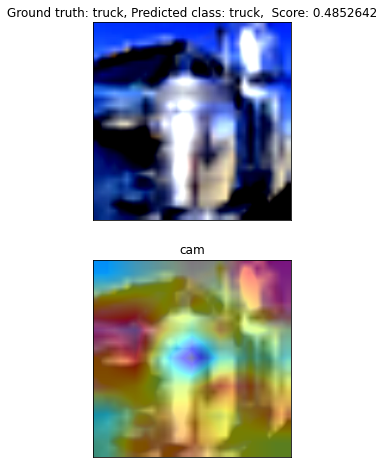

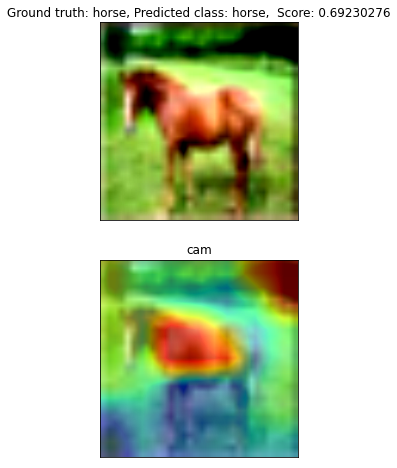

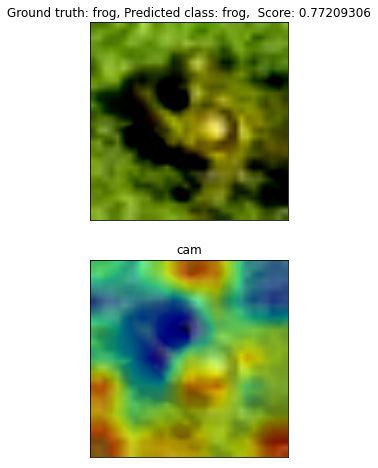

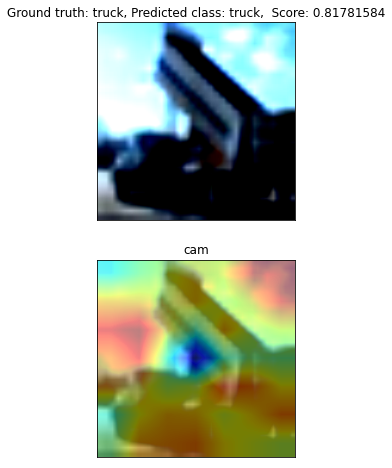

In [ ]:
m = 0
for i in range(len(test_images)):
  img = test_images[i]
  img_label = int(test_true_labels[i])
  img_pred = int(test_pred_labels[i])
  img_score = test_pred_scores[i]
  cam_img = total_cam_images[i]

  fig = plt.figure(figsize=(8, 8))
  ax = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])
  imshow(img)
  ax.set_title('Ground truth: '+ classes[img_label]  +', Predicted class: '+ classes[img_pred]+ ',  Score: ' + str(img_score))
  ax = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
  imshow(img)
  plt.imshow(cam_img, alpha=0.5, cmap='jet')
  ax.set_title('cam')
  
  m+= 1
  if m > 50:
    break

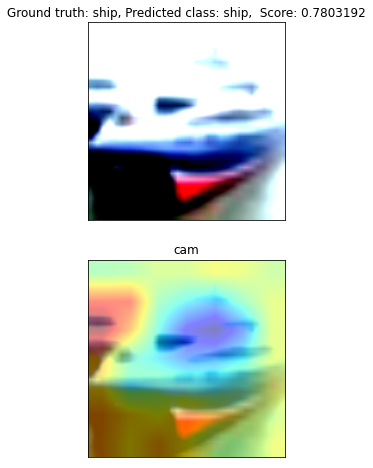

In [ ]:
img = test_images[1]
img_label = int(test_true_labels[1])
img_pred = int(test_pred_labels[1])
img_score = test_pred_scores[1]
cam_img = total_cam_images[1]

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])
imshow(img)
ax.set_title('Ground truth: '+ classes[img_label]  +', Predicted class: '+ classes[img_pred]+ ',  Score: ' + str(img_score))
ax = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
imshow(img)
plt.imshow(cam_img, alpha=0.5, cmap='jet')
ax.set_title('cam')
plt.savefig(model_path+'tjj.png')

In [ ]:
def get_plot_image(img, t_label, p_label, score, cam, f_name):
  img = img
  img_label = int(t_label)
  img_pred = int(p_label)
  img_score = score
  cam_img = cam

  fig = plt.figure(figsize=(8, 8))
  ax = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])
  imshow(img)
  ax.set_title('Ground truth: '+ classes[img_label]  +', Predicted class: '+ classes[img_pred]+ ',  Score: ' + str(img_score))
  ax = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
  imshow(img)
  plt.imshow(cam_img, alpha=0.5, cmap='jet')
  ax.set_title('cam')
  plt.savefig(f_name)

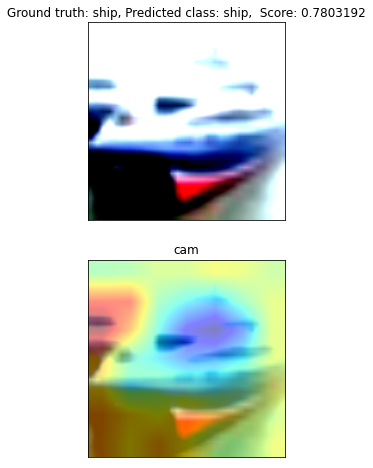

In [ ]:
get_plot_image(test_images[1],test_true_labels[1],test_pred_labels[1], test_pred_scores[1], total_cam_images[1],model_path+'fn.png' )

**Separating 50 images that are wrongly classified**

Completed...!


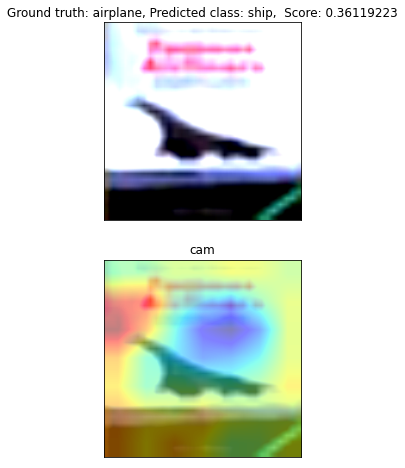

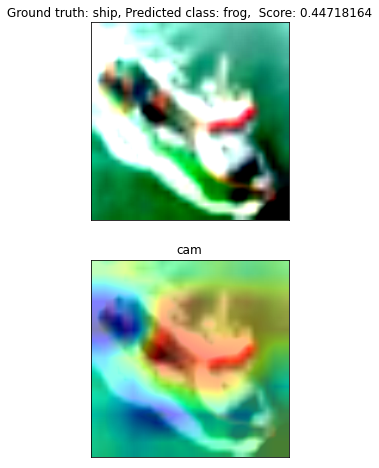

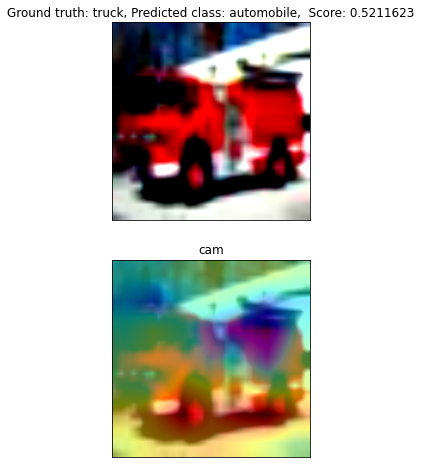

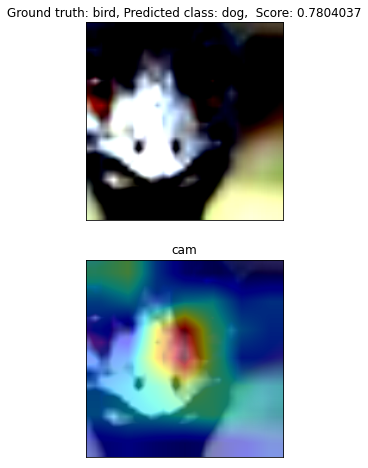

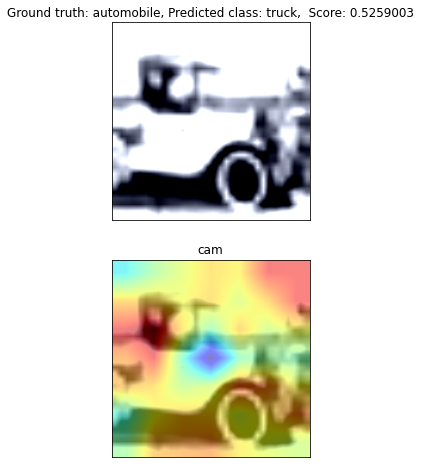

...

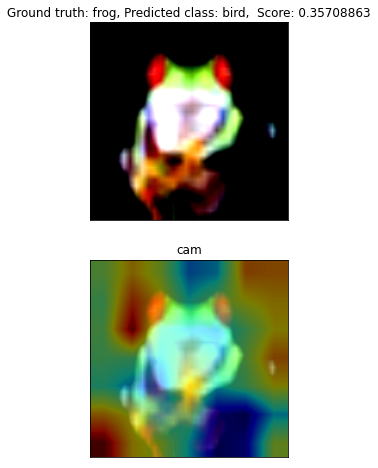

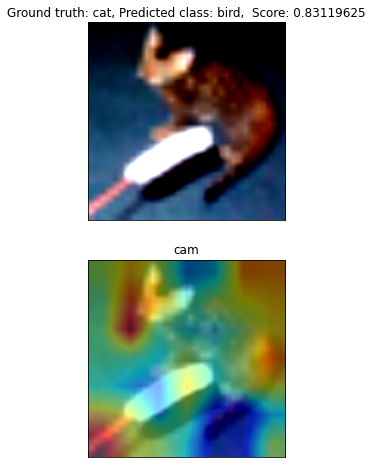

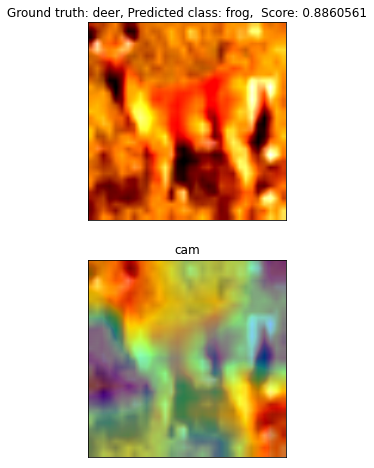

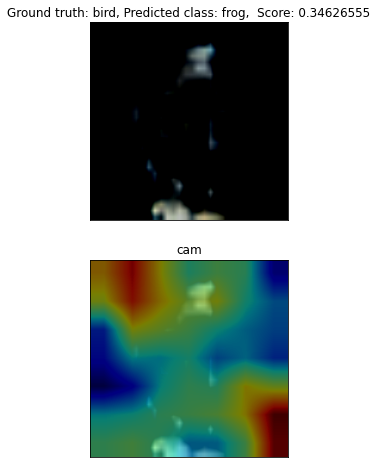

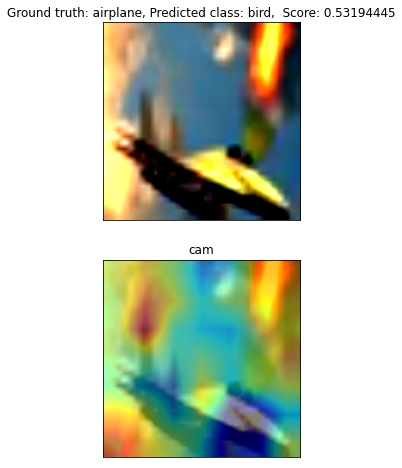

In [ ]:
wrong_path = "/content/drive/MyDrive/Colab Notebooks/Neural Networks/CAM_images/Wrong/"

class_0_path = wrong_path+ "class_0/"
class_1_path = wrong_path+ "class_1/"
class_2_path = wrong_path+ "class_2/"
class_3_path = wrong_path+ "class_3/"
class_4_path = wrong_path+ "class_4/"
class_5_path = wrong_path+ "class_5/"
class_6_path = wrong_path+ "class_6/"
class_7_path = wrong_path+ "class_7/"
class_8_path = wrong_path+ "class_8/"
class_9_path = wrong_path+ "class_9/"


cls_0 = 1
cls_1 = 1
cls_2 = 1
cls_3 = 1
cls_4 = 1
cls_5 = 1
cls_6 = 1
cls_7 = 1
cls_8 = 1
cls_9 = 1

k = 1

for i in range(len(total_cam_images)):
  if (test_true_labels[i] == 0) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[0] +'-' +str(cls_0) +'_CAM.png'

    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_0_path+img_name)
    
    cls_0 += 1

    if cls_0 > 5:
      break

  if (test_true_labels[i] == 1) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[1] +'-' +str(cls_1) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_1_path+img_name)
      
    cls_0 += 1

    if cls_0 > 5:
      break

  if (test_true_labels[i] == 2) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[2] +'-' +str(cls_2) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_2_path+img_name)
      
    cls_2 += 1

    if cls_2 > 5:
      break

  if (test_true_labels[i] == 3) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[3] +'-' +str(cls_3) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_3_path+img_name)
      
    cls_3 += 1

    if cls_3 > 5:
      break

  if (test_true_labels[i] == 4) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[4] +'-' +str(cls_4) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_4_path+img_name)

    if cls_4 > 5:
      break

  if (test_true_labels[i] == 5) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[5] +'-' +str(cls_5) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_5_path+img_name)
      
    cls_5 += 1

    if cls_5 > 5:
      break 

  if (test_true_labels[i] == 6) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[6] +'-' +str(cls_6) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_6_path+img_name)
      
    cls_6 += 1

    if cls_6 > 5:
      break 

  if (test_true_labels[i] == 7) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[7] +'-' +str(cls_7) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_7_path+img_name)
      
    cls_7 += 1

    if cls_7 > 5:
      break 

  if (test_true_labels[i] == 8) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[8] +'-' +str(cls_8) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_8_path+img_name)
      
    cls_8 += 1

    if cls_8 > 5:
      break 

  if (test_true_labels[i] == 9) and (test_true_labels[i] != test_pred_labels[i]):
    # defining image name for each class 
    img_name = classes[9] +'-' +str(cls_9) +'_CAM.png'
    # getting image
    img = test_images[i]
    img_label = int(test_true_labels[i])
    img_pred = int(test_pred_labels[i])
    img_score = test_pred_scores[i]
    cam_img = total_cam_images[i]

    #saving images 
    get_plot_image(img, img_label, img_pred, img_score, cam_img, class_9_path+img_name)
      
    cls_9 += 1

    if cls_9 > 5:
      break
print("Completed...!")

In [ ]:
if 2 != 3:
  print('Hoyse')

Hoyse
